In [1]:
import numpy as np
import pandas as pd
import torch
import json
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold
import scipy

import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

from torch import nn
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter

from sklearn.cluster import KMeans

import seaborn as sns

from torcheval.metrics.functional import r2_score

# The main idea is to generate pseudo-labels (aka guessed labels) to computate both Labeled abd Unlabeled losses

### Weights that describes distribution of data in cells (Gaussian like)

In [2]:
def get_weigths(dataset):
    weights = []
    for batches in dataset:
        batch_weights = []
        for batch in batches:
            target_weights = []
            for y in batch:
                # where it belongs
                for j in range(len(bin_edges)-1):
                    if y >= bin_edges[j] and y <= bin_edges[j+1]:
                        target_weights.append(
                            error_weights[j]
                        )
            batch_weights.append(target_weights)
        weights.append(batch_weights)
    weights = np.array(weights)
    weights = torch.from_numpy(weights)
    # weights = weights.to(device)
    return weights
# print(yhat_loss.shape)

In [3]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

## Making training-testing tensor datasets under CV split

In [4]:
with open("core_parts.json", "r") as f:
    core_parts = json.load(f)

In [5]:
cores_l = pd.read_excel("input.xlsx", sheet_name="no_burnup")
cores_u = pd.read_excel("burnup_only.xlsx", index_col=0)

In [6]:
fuel_types = cores_l.loc[0, core_parts["fuel_type"]["ALL_CELLS"]].to_numpy()

In [7]:
cores_l.loc[:, core_parts["left"]["ALL_CELLS"]] = fuel_types - cores_l.loc[:, core_parts["burnup"]["ALL_CELLS"]].to_numpy()
cores_u.loc[:, core_parts["left"]["ALL_CELLS"]] = fuel_types - cores_u.loc[:, core_parts["burnup"]["ALL_CELLS"]].to_numpy()

In [8]:
cores_u.loc[:, core_parts["coef"]["ALL_CELLS"]] = None

### Shuffle dataframes before tensorizing

In [9]:
cores_l = cores_l.sample(frac=1)
cores_u = cores_u.sample(frac=1)

In [48]:
cores_l_Xtofit = cores_u.loc[:, 
    [
        *core_parts["burnup"]["ALL_CELLS"],
        # *core_parts["left"]["ALL_CELLS"]
    ]
]
cores_l_ytofit = cores_l.loc[:, 
    [
        *core_parts["coef"]["ALL_CELLS"]
    ]
]

In [49]:
mmsX = MinMaxScaler(feature_range=(0,1))
mmsX.fit(cores_l_Xtofit)

mmsy = MinMaxScaler(feature_range=(0,1))
mmsy.fit(cores_l_ytofit)

MinMaxScaler()

In [50]:
# cores_u = cores_l.iloc[80:160, :]
cores_l = cores_l.iloc[:256, :]
# cores_u.loc[:, core_parts["coef"]["ALL_CELLS"]] = None

<Axes: xlabel='7-6_b', ylabel='7-6_s'>

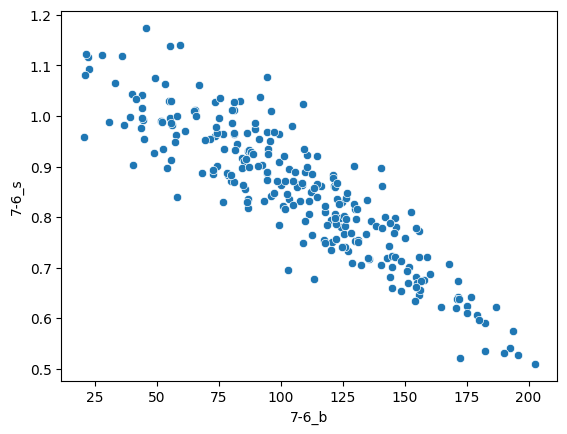

In [51]:
sns.scatterplot(x=cores_l.loc[:, core_parts["burnup"]["ALL_CELLS"][0]], y=cores_l.loc[:, core_parts["coef"]["ALL_CELLS"][0]])

In [52]:
cores_u.shape, cores_l.shape

((12000, 60), (256, 82))

### Dataset formation

In [53]:
Xl = cores_l.loc[:, 
    [
        *core_parts["burnup"]["ALL_CELLS"],
        # *core_parts["left"]["ALL_CELLS"]
    ]
]
yl = cores_l.loc[:, core_parts["coef"]["ALL_CELLS"]]

In [54]:
Xu = cores_u.loc[:, 
    [
        *core_parts["burnup"]["ALL_CELLS"],
        # *core_parts["left"]["ALL_CELLS"]
    ]
]
yu = cores_u.loc[:, core_parts["coef"]["ALL_CELLS"]]

In [55]:
Xl = mmsX.transform(Xl)
Xu = mmsX.transform(Xu)

yl = mmsy.transform(yl)


### CV split

In [56]:
ns = 2
kf = KFold(n_splits=ns)
train_size = int(len(Xl) * (ns-1) / ns)
test_size = len(Xl) - train_size
splits_ind = list(kf.split(Xl))
train_size, test_size

(128, 128)

### Started with making batches of tensors

In [57]:

# batch size of labeled data
lbatch = 8
# test set tensor
tbatch = 8

# unlabeled batch size and U to L ratio
cores_l_taken = train_size
cr = 1 * cores_l_taken
print(cr)
RUL = f"{cr}_{cores_l_taken}"

Xu_cr = Xu[:cr]
yu_cr = yu[:cr]

cv_datasets = []
for (train, test) in splits_ind[:ns]:
    Xyl_train = np.concatenate(
        ( Xl[train], yl[train] ),
        axis=1
    )
    Xylb_train = np.asarray(np.split(Xyl_train, len(Xyl_train)/lbatch))
    Xylb_train = np.asarray(Xylb_train).astype("float32")

    # tensor
    Xylb_train_tensor = torch.from_numpy(Xylb_train)

    Xyu_train = np.concatenate(
        (Xu_cr, yu_cr),
        axis=1
    )
    
    Xyub_train = np.asarray(np.split(Xyu_train, len(Xyl_train)/lbatch))
    Xyub_train = np.asarray(Xyub_train).astype("float32")
    
    Xyub_train_tensor = torch.from_numpy(Xyub_train)
    
    Xyl_test = np.concatenate(
        ( Xl[test], yl[test] ),
        axis=1
    )
    
    Xylb_test = np.asarray(np.split(Xyl_test, len(Xyl_test)/tbatch))
    Xylb_test = np.asarray(Xylb_test).astype("float32")
    # tensor
    Xylb_test_tensor = torch.from_numpy(Xylb_test)
    print(
        "train_set: ", Xylb_train_tensor.shape, 
        "test_set: ", Xylb_test_tensor.shape,
        "unlabeled_set: ", Xyub_train_tensor.shape
    )

    # do concat of L and U tensors
    Xy_train_tensor_cat = torch.cat(
        (Xylb_train_tensor, Xyub_train_tensor),
        dim=1
    )
    # shuffle batches
    Xy_train_tensor_cat = Xy_train_tensor_cat[
        torch.randperm(
            Xy_train_tensor_cat.shape[0] #index of batches
        )
    ]
    print(Xy_train_tensor_cat.shape)
    # train test tensors split
    inputs = 20
    X_train_tensor = Xy_train_tensor_cat[:, :, :inputs]
    X_test_tensor = Xylb_test_tensor[: , :, :inputs]
    
    y_train_tensor = Xy_train_tensor_cat[:, :, inputs:]
    y_test_tensor = Xylb_test_tensor[: , :, inputs:]

    # tensor dataset
    xy_train = TensorDataset(
        X_train_tensor,
        y_train_tensor
    )
    
    xy_test =  TensorDataset(
        X_test_tensor,
        y_test_tensor,
    )
    # to unpack and iterate over
    cv_datasets.append(
        (xy_train, xy_test)
    )
    

128
train_set:  torch.Size([16, 8, 40]) test_set:  torch.Size([16, 8, 40]) unlabeled_set:  torch.Size([16, 8, 40])
torch.Size([16, 16, 40])
train_set:  torch.Size([16, 8, 40]) test_set:  torch.Size([16, 8, 40]) unlabeled_set:  torch.Size([16, 8, 40])
torch.Size([16, 16, 40])


## Model

In [413]:
class SModel(nn.Module):
    def __init__(
        self
    ):
        super().__init__()

        # self.encoder = nn.Sequential(
        #     nn.Linear(20, 10),
        #     nn.ReLU(),
        #     nn.Linear(10, 5),
        #     nn.Sigmoid()
        # )
        
        # FNN
        self.encoderx = nn.Sequential(
            nn.Linear(40, 64),
            nn.ReLU(),
            nn.Linear(64, 20)
        )
        
        # self.encodery = nn.Sequential(
        #     nn.Linear(20, 4),
        #     nn.ReLU()
        # )
        self.predictory = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.decoderx = nn.Sequential(
            nn.Linear(30, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        self.muz = nn.Linear(20,10)
        self.logvarz = nn.Linear(20,10)

    
    def forward(
        self,
        x,
        yprior = None,
    ):
        yhat = self.predictory(x)
        if yprior is not None:
            yhat = yprior
        
        # encoder takes both x and y -> shape of x+y
        xy = torch.cat(
            (x,yhat),
            dim=1
        )
        xy_encoded = self.encoderx(xy)
        
        # latent space takes both x and z
        mu, logvar, z = self.reparametrize(xy_encoded, self.muz, self.logvarz)
        
        # decoder takes both z and y -> shape of y+z
        zy = torch.cat(
            (z, yhat),
            dim=1
        )
        
        # shape of input x
        x_decoded = self.decoderx(zy)
        
        return x_decoded, yhat, mu, logvar, z

    def reparametrize(
        self,
        x,
        mu,
        logvar
    ):
        mu = F.relu(
            mu(x)
        )
        logvar = F.relu(
            logvar(x)
        )

        mu = mu.mean(dim=0)
        std = torch.exp(logvar/2).mean(dim=0)
        std_tril = torch.diag_embed(std)
        MVN = torch.distributions.MultivariateNormal(
            mu,
            scale_tril=std_tril
        )
        
        # std = torch.exp(logvar/2)
        # z = mu + std*torch.rand_like(std)
        
        return mu, logvar, MVN.sample(torch.Size([x.shape[0]]))

def reconstruction_loss(
    target,
    pred,
    batch_size
):
    
    # recon_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    recon_loss = F.l1_loss(pred, target)
    
    return recon_loss

def supervised_loss(
    target,
    pred,
    mu,
    logvar,
    batch_size
):
    # yhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    yhat_loss = F.l1_loss(pred, target)
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - torch.exp(logvar))
    return yhat_loss + kl_loss, yhat_loss, kl_loss

def unsupervised_loss(
    target_mean,
    pred, 
    batch_size
):
    
    yhat_loss = F.l1_loss(pred, target_mean, reduction='sum') / batch_size
    # print(pred[0], target_mean[0])
    # yhat_loss = torch.sqrt(yhat_loss)
    return yhat_loss 

In [313]:
def test(
    model,
    dataset,
    L,
    epoch_num
):

        loss_y_epoch = 0
        r2_epoch = 0

        loss_recon_epoch = 0
        with torch.no_grad():
            for nbatch, (X,y) in enumerate(dataset):
                # so it is shape of [32, 1]
                # y = y[:, 0:1]
                
                
                y = y.to(device)
                y_deep = torch.clone(y)

                X = X.to(device)
                
                x_decoded, yhat, mu, logvar, z = model(X)
                # if yprior is True
                # x_decoded, yhat, mu, logvar, z = model(X,y)

                loss_y = F.l1_loss(y, yhat)
                loss_recon = F.l1_loss(X, x_decoded)
                
                loss_y_epoch += loss_y.item()
                loss_recon_epoch += loss_recon.item()
                
                r2 = r2_score(y, yhat, multioutput="raw_values")
                r2_mean = r2.mean()
                r2_epoch += r2_mean.item()

            print(
                "Test: ",
                x_decoded[0],
                X[0]
            )
            
            loss_y_epoch = loss_y_epoch / len(dataset)
            loss_recon_epoch = loss_recon_epoch / len(dataset) 
            r2_epoch = r2_epoch / len(dataset)
            
            print(r2_epoch)

            return loss_y_epoch, loss_recon_epoch, r2_epoch
            



In [314]:
# yaug = 0.1

def get_noise(loc, scale, size, coef=0.1):
    
    tril = torch.diag_embed(scale)
    mvn = torch.distributions.MultivariateNormal(
        loc,
        scale_tril=tril
    )
    samples = mvn.sample(torch.Size([size]))
    res = ( samples - samples.mean(dim=0) )*coef

    return res

def get_row_noise(batch, coef):
    # columns_shape = batch.shape[-1]
    columns_mean = batch.mean(dim=1)

    noise1 = torch.rand(*batch.shape)*coef
    noise2 = torch.rand(*batch.shape)*coef

    noise = noise1 - noise2
    # print(batch[0], noise[0] + batch[0])
    # print(batch[0].mean(), (noise[0] + batch[0]).mean())
    return noise
    
    

def train(
    model,
    dataset,
    L,
    u,
    r,
    noise_level,
    optimizer,
    epoch_num,
):
        loss_epoch  = 0

        recon_epoch_loss = 0
        
        supervised_epoch_loss = 0
        kl_epoch_loss = 0
    
        yl_epoch_loss = 0
        yresid_epoch_loss = 0
        yu_epoch_loss = 0


        for nbatch, (X,y) in enumerate(dataset):
            # so it is shape of [32, 1]
            # y = y[:, 0:1]
            
            y = y.to(device)
            # left only cell 7-6
            
            
            y_deep = torch.clone(y)

            Xl = X[:lbatch]
            Xu = X[lbatch:]
            # print(Xl.shape, Xu.shape)
            yl = y[:lbatch]
            yu = y[lbatch:]

            Xaug_up = torch.tensor([])
            Xaug_um = torch.tensor([])
            Xaug_lp = torch.tensor([])
            Xaug_lm = torch.tensor([])
            
            for _ in range(L):
                # aug l part
                
                noise_l = get_row_noise(Xl, noise_level)
                
                Xaug_lp = torch.cat(
                    (
                        Xaug_lp,
                        Xl + noise_l    
                    ),
                    dim=0
                )
                Xaug_lm = torch.cat(
                    (
                        Xaug_lm,
                        Xl - noise_l    
                    ),
                    dim=0
                )
                # print(nbatch, Xl[0])
                
                # aug u part
                noise_u = get_row_noise(Xu, noise_level)
                
                # add
                Xaug_up = torch.cat(
                    (
                        Xaug_up,
                        Xu + noise_u    
                    ),
                    dim=0
                )
                # print(Xu[0], noise_u[0], Xaug_up[0])
                # sub
                Xaug_um = torch.cat(
                    (
                        Xaug_um,
                        Xu - noise_u    
                    ),
                    dim=0
                )
            
            # Zero the gradients
            optimizer.zero_grad()
            
            Xl = Xl.to(device)
            Xu = Xu.to(device)
            
            Xaug_lp = Xaug_lp.to(device)
            Xaug_lm = Xaug_lm.to(device)
            
            Xaug_up = Xaug_up.to(device)
            Xaug_um = Xaug_um.to(device)
            


            if u != 0:
            
                labels_l, labels_um, labels_up = model(Xl, Xaug_um, Xaug_up)
                
                labels_upm = (labels_up + labels_um) / 2
    
                labels_upm_chunks = torch.reshape(
                    labels_upm, 
                    (L, int(labels_upm.shape[0]/L), labels_upm.shape[-1])
                )
                labels_upm = labels_upm_chunks.mean(dim=0)
                
                # lets say it is mean for u data
                labels_u = model(Xu, None, None)
                
                loss_u = unsupervised_loss(
                    labels_u,
                    labels_upm,
                    labels_u.shape[0]
                )
                yu_epoch_loss += loss_u.item()
    
                #supervised
                loss_l = supervised_loss(
                    yl,
                    labels_l,
                    Xl.shape[0]
                )
                
                yl_epoch_loss += loss_l.item()
    
                
                # # l + u only
                loss = loss_l + u*loss_u

            else:
                x_decoded, yhat, mu, logvar, z = model(Xl)
                # yprior is true
                # x_decoded, yhat, mu, logvar, z = model(Xl, yl)
                recon_loss = reconstruction_loss(
                    Xl,
                    x_decoded,
                    Xl.shape[0]
                )
                recon_epoch_loss += recon_loss.item()
                
                s_loss, loss_y, kl_loss = supervised_loss(
                    yl,
                    yhat,
                    mu,
                    logvar,
                    Xl.shape[0]
                )
                supervised_epoch_loss += s_loss.item()
                yl_epoch_loss += loss_y.item()
                kl_epoch_loss += kl_loss.item()

                loss = r*recon_loss + s_loss
                
            
            loss.backward()
            optimizer.step()
            
            loss_epoch += loss.item()
            
    
        loss_epoch = loss_epoch / len(dataset)
        recon_epoch_loss = recon_epoch_loss / len(dataset)
        yl_epoch_loss = yl_epoch_loss / len(dataset)
        supervised_epoch_loss = supervised_epoch_loss / len(dataset)
        kl_epoch_loss = kl_epoch_loss / len(dataset)
    
        print(
            yl_epoch_loss,
            recon_epoch_loss,
            kl_epoch_loss
            
        )

        return loss_epoch, recon_epoch_loss, yl_epoch_loss, kl_epoch_loss


        



In [ ]:
# U = [0.01, 0.1, 1]
# U = [3, 5]
U = [0]
# Ls = [1,2,3,4,5,6,7,8,9,10]
# Ls = [1, 8, 16]
Ls = [1]
R = [0.0001, 0.001, 0.01, 0.1, 1, 10]
# R = [1]

noise=0.1

for u in U:
    for L in Ls:
        for r in R:
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/extend_z_shape_recon_coef_{r}_yprior')
            writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/extend_z_shape_MVN_recon_coef_{r}')
            
            train_loss_cv, train_yl_loss_cv, train_recon_loss_cv, train_kl_loss_cv = [], [], [], []
            test_loss_cv, test_recon_cv, test_r2_cv = [], [], []
            
            # for (xy_train, xy_test) in cv_datasets:
            # instead of cv we do run same model multiple times to average results
            xy_train, xy_test = cv_datasets[0]
            for _ in range(1):
                model = SModel().to(device)
                adam = torch.optim.Adam(model.parameters())
                epoch = 5000
    
                train_loss_epoches, train_yl_loss_epoches, train_recon_loss_epoches, train_kl_loss_epoches = [], [], [], []
                test_loss_epoches, test_recon_epoches, test_r2_epoches = [], [], []
                for e in range(epoch):
                    train_loss_epoch, train_recon_epoch_loss, train_yl_epoch_loss, train_kl_epoch_loss = train(
                        model,
                        xy_train,
                        L,
                        u,
                        r,
                        noise,
                        adam,
                        e
                    )
                    train_loss_epoches.append(train_loss_epoch)
                    train_yl_loss_epoches.append(train_yl_epoch_loss)
                    
                    train_recon_loss_epoches.append(train_recon_epoch_loss)
                    
                    train_kl_loss_epoches.append(train_kl_epoch_loss)
                     
                    test_loss_epoch, test_recon_epoch, test_r2_epoch = test(
                        model,
                        xy_test,
                        L,
                        e
                    )
                    test_loss_epoches.append(test_loss_epoch)
                    test_r2_epoches.append(test_r2_epoch)
                    test_recon_epoches.append(test_recon_epoch)
                
                train_loss_cv.append(train_loss_epoches.copy())
                train_yl_loss_cv.append(train_yl_loss_epoches.copy())
    
                train_recon_loss_cv.append(train_recon_loss_epoches.copy())
                
                train_kl_loss_cv.append(train_kl_loss_epoches.copy())
                
                test_loss_cv.append(test_loss_epoches.copy())
                test_recon_cv.append(test_recon_epoches.copy())
                test_r2_cv.append(test_r2_epoches.copy())
            
            # averaging results over cv
            train_loss_cv = np.asarray(train_loss_cv).mean(axis=0)
            train_yl_loss_cv = np.asarray(train_yl_loss_cv).mean(axis=0)
    
            train_recon_loss_cv =np.asarray(train_recon_loss_cv).mean(axis=0)
            train_kl_loss_cv = np.asarray(train_kl_loss_cv).mean(axis=0)
            
            test_loss_cv = np.asarray(test_loss_cv).mean(axis=0)
            test_recon_cv = np.asarray(test_recon_cv).mean(axis=0)
            test_r2_cv = np.asarray(test_r2_cv).mean(axis=0)
            
            # adding to writer
            for e in range(len(test_loss_cv)):
                # print(e)
                writer.add_scalar('Train/epoch_loss', train_loss_cv[e], global_step=e)
                writer.add_scalar('Train/yl_Loss', train_yl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/kl_Loss', train_kl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/recon_Loss', train_recon_loss_cv[e], global_step=e)
                            
                
                writer.add_scalar('Test/y_loss', test_loss_cv[e], global_step=e)
                writer.add_scalar('Test/recon_loss', test_recon_cv[e], global_step=e)
                writer.add_scalar('Test/r2_mean', test_r2_cv[e], global_step=e)
            # if u == 0:
            #     break

0.15030504018068314 0.14885882288217545 1.2305151671171188
Test:  tensor([0.5624, 0.4510, 0.4251, 0.5909, 0.5779, 0.4915, 0.5390, 0.5270, 0.5278,
        0.4009, 0.4980, 0.5748, 0.5242, 0.4983, 0.4297, 0.4486, 0.4645, 0.5007,
        0.4821, 0.5175], device='cuda:0') tensor([0.5648, 0.5976, 0.6305, 0.3304, 0.7200, 0.4082, 0.5211, 0.2189, 0.3733,
        0.6439, 0.4492, 0.4247, 0.3999, 0.3294, 0.6336, 0.6667, 0.6420, 0.6270,
        0.2641, 0.6445], device='cuda:0')
-412.5113754272461
0.15012669935822487 0.1464039385318756 0.2528695911169052
Test:  tensor([0.5385, 0.4520, 0.4579, 0.5495, 0.5851, 0.4754, 0.5162, 0.5176, 0.4919,
        0.4485, 0.4720, 0.5451, 0.5057, 0.4673, 0.4751, 0.4336, 0.5172, 0.4999,
        0.4770, 0.4781], device='cuda:0') tensor([0.5648, 0.5976, 0.6305, 0.3304, 0.7200, 0.4082, 0.5211, 0.2189, 0.3733,
        0.6439, 0.4492, 0.4247, 0.3999, 0.3294, 0.6336, 0.6667, 0.6420, 0.6270,
        0.2641, 0.6445], device='cuda:0')
-390.5724792480469
0.149405125528574 0.143

# DO SVAE but y is probalistic

In [405]:
class SModel(nn.Module):
    def __init__(
        self
    ):
        super().__init__()

        # self.encoder = nn.Sequential(
        #     nn.Linear(20, 10),
        #     nn.ReLU(),
        #     nn.Linear(10, 5),
        #     nn.Sigmoid()
        # )
        
        # FNN
        self.encoderx = nn.Sequential(
            nn.Linear(40, 64),
            nn.ReLU(),
            nn.Linear(64, 40)
        )
        
        # self.encodery = nn.Sequential(
        #     nn.Linear(20, 4),
        #     nn.ReLU()
        # )
        self.predictory = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.decoderx = nn.Sequential(
            nn.Linear(40, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        self.muz = nn.Linear(40,20)
        self.logvarz = nn.Linear(40,20)

        self.muy = nn.Linear(40,20)
        self.logvary = nn.Linear(40,20)

    
    def forward(
        self,
        x,
        yprior = None,
    ):
        yhat = self.predictory(x)
        # muy, logvary, yhat = self.reparametrize(yout, self.muy, self.logvary)
        
        if yprior is not None:
            yhat = yprior
        
        # encoder takes both x and y -> shape of x+y
        xy = torch.cat(
            (x,yhat),
            dim=1
        )
        xy_encoded = self.encoderx(xy)
        
        # latent space takes both x and z
        muz, logvarz, z = self.reparametrize(xy_encoded, self.muz, self.logvarz)
        
        # decoder takes both z and y -> shape of y+z
        zy = torch.cat(
            (z, yhat),
            dim=1
        )
        
        # shape of input x
        x_decoded = self.decoderx(zy)
        
        # return x_decoded, muy, logvary, yhat, muz, logvarz, z
        return x_decoded, _, _, yhat, muz, logvarz, z

    def reparametrize(
        self,
        x,
        mu,
        logvar
    ):
        mu = F.relu(
            mu(x)
        )
        logvar = F.relu(
            logvar(x)
        )

        mu = mu.mean(dim=0)
        std = torch.exp(logvar/2).mean(dim=0)
        std_tril = torch.diag_embed(std)
        MVN = torch.distributions.MultivariateNormal(
            mu,
            scale_tril=std_tril
        )
        
        # std = torch.exp(logvar/2)
        # z = mu + std*torch.rand_like(std)
        
        return mu, logvar, MVN.sample(torch.Size([x.shape[0]]))

def reconstruction_loss(
    target,
    pred,
    batch_size
):
    
    recon_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # recon_loss = F.l1_loss(pred, target)
    
    return recon_loss

def supervised_loss(
    target,
    pred,
    muy,
    logvary,
    mu,
    logvar,
    batch_size
):
    # yhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.l1_loss(pred, target)

    # yhat_loss = torch.mean(0.5+0.5*(torch.div((muy-0.5).pow(2), logvary.exp()) + logvary))
    yl_mu = target.mean(dim=0)
    yl_std = target.std(dim=0)
    yl_std_tril = torch.diag_embed(yl_std)
    yl_sample = torch.distributions.MultivariateNormal(
        yl_mu,
        scale_tril=yl_std_tril
    ).sample(torch.Size([batch_size]))

    # print(target[0], yl_sample[0], yl_mu, yl_sample.mean(dim=0))
    
    yhat_mu = pred.mean(dim=0)
    yhat_std = pred.std(dim=0)
    yhat_std_tril = torch.diag_embed(yhat_std)
    yhat_sample = torch.distributions.MultivariateNormal(
        yhat_mu,
        scale_tril=yhat_std_tril
    ).sample(torch.Size([batch_size]))
    
    yhat_sample_loss = F.l1_loss(yhat_sample, yl_sample, reduction='sum') / batch_size
    yhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.kl_div(yhat_sample, yl_sample)
    yhat_prob_loss = torch.sum(torch.log(yhat_std) - torch.log(yl_std) + 0.5 * ( yl_std.pow(2) + ( yl_mu - yhat_mu )**2 ) / yhat_std.pow(2) - 0.5)
    
    print(yhat_prob_loss, yhat_sample_loss, yhat_loss)

    # yhat_loss = yhat_sample_loss
    
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - torch.exp(logvar))
    return yhat_loss + kl_loss, yhat_loss, kl_loss
    # return yhat_loss + kl_loss, yhat_loss, kl_loss

def unsupervised_loss(
    target_mean,
    pred, 
    batch_size
):
    
    yhat_loss = F.l1_loss(pred, target_mean, reduction='sum') / batch_size
    # print(pred[0], target_mean[0])
    # yhat_loss = torch.sqrt(yhat_loss)
    return yhat_loss 

In [406]:
def test(
    model,
    dataset,
    L,
    epoch_num
):

        loss_y_epoch = 0
        r2_epoch = 0

        loss_recon_epoch = 0
        with torch.no_grad():
            for nbatch, (X,y) in enumerate(dataset):
                # so it is shape of [32, 1]
                # y = y[:, 0:1]
                
                
                y = y.to(device)
                y_deep = torch.clone(y)

                X = X.to(device)
                
                x_decoded, muy, logvary, yhat, muz, logvarz, z = model(X)
                # if yprior is True
                # x_decoded, yhat, mu, logvar, z = model(X,y)

                loss_y = F.l1_loss(y, yhat, reduction='sum') / X.shape[0]
                loss_recon = F.l1_loss(X, x_decoded, reduction='sum') / X.shape[0]
                
                loss_y_epoch += loss_y.item()
                loss_recon_epoch += loss_recon.item()
                
                r2 = r2_score(y, yhat, multioutput="raw_values")
                r2_mean = r2.mean()
                r2_epoch += r2_mean.item()

            print(
                "Test: ",
                x_decoded[0],
                X[0]
            )
            
            loss_y_epoch = loss_y_epoch / len(dataset)
            loss_recon_epoch = loss_recon_epoch / len(dataset) 
            r2_epoch = r2_epoch / len(dataset)
            
            print(r2_epoch)

            return loss_y_epoch, loss_recon_epoch, r2_epoch
            



In [408]:
# yaug = 0.1

def get_noise(loc, scale, size, coef=0.1):
    
    tril = torch.diag_embed(scale)
    mvn = torch.distributions.MultivariateNormal(
        loc,
        scale_tril=tril
    )
    samples = mvn.sample(torch.Size([size]))
    res = ( samples - samples.mean(dim=0) )*coef

    return res

def get_row_noise(batch, coef):
    # columns_shape = batch.shape[-1]
    columns_mean = batch.mean(dim=1)

    noise1 = torch.rand(*batch.shape)*coef
    noise2 = torch.rand(*batch.shape)*coef

    noise = noise1 - noise2
    # print(batch[0], noise[0] + batch[0])
    # print(batch[0].mean(), (noise[0] + batch[0]).mean())
    return noise
    
    

def train(
    model,
    dataset,
    L,
    u,
    r,
    noise_level,
    optimizer,
    epoch_num,
):
        loss_epoch  = 0

        recon_epoch_loss = 0
        
        supervised_epoch_loss = 0
        kl_epoch_loss = 0
    
        yl_epoch_loss = 0
        yresid_epoch_loss = 0
        yu_epoch_loss = 0


        for nbatch, (X,y) in enumerate(dataset):
            # so it is shape of [32, 1]
            # y = y[:, 0:1]
            
            y = y.to(device)
            # left only cell 7-6
            
            
            y_deep = torch.clone(y)

            Xl = X[:lbatch]
            Xu = X[lbatch:]
            # print(Xl.shape, Xu.shape)
            yl = y[:lbatch]
            yu = y[lbatch:]

            Xaug_up = torch.tensor([])
            Xaug_um = torch.tensor([])
            Xaug_lp = torch.tensor([])
            Xaug_lm = torch.tensor([])
            
            for _ in range(L):
                # aug l part
                
                noise_l = get_row_noise(Xl, noise_level)
                
                Xaug_lp = torch.cat(
                    (
                        Xaug_lp,
                        Xl + noise_l    
                    ),
                    dim=0
                )
                Xaug_lm = torch.cat(
                    (
                        Xaug_lm,
                        Xl - noise_l    
                    ),
                    dim=0
                )
                # print(nbatch, Xl[0])
                
                # aug u part
                noise_u = get_row_noise(Xu, noise_level)
                
                # add
                Xaug_up = torch.cat(
                    (
                        Xaug_up,
                        Xu + noise_u    
                    ),
                    dim=0
                )
                # print(Xu[0], noise_u[0], Xaug_up[0])
                # sub
                Xaug_um = torch.cat(
                    (
                        Xaug_um,
                        Xu - noise_u    
                    ),
                    dim=0
                )
            
            # Zero the gradients
            optimizer.zero_grad()
            
            Xl = Xl.to(device)
            Xu = Xu.to(device)
            
            Xaug_lp = Xaug_lp.to(device)
            Xaug_lm = Xaug_lm.to(device)
            
            Xaug_up = Xaug_up.to(device)
            Xaug_um = Xaug_um.to(device)
            


            if u != 0:
            
                labels_l, labels_um, labels_up = model(Xl, Xaug_um, Xaug_up)
                
                labels_upm = (labels_up + labels_um) / 2
    
                labels_upm_chunks = torch.reshape(
                    labels_upm, 
                    (L, int(labels_upm.shape[0]/L), labels_upm.shape[-1])
                )
                labels_upm = labels_upm_chunks.mean(dim=0)
                
                # lets say it is mean for u data
                labels_u = model(Xu, None, None)
                
                loss_u = unsupervised_loss(
                    labels_u,
                    labels_upm,
                    labels_u.shape[0]
                )
                yu_epoch_loss += loss_u.item()
    
                #supervised
                loss_l = supervised_loss(
                    yl,
                    labels_l,
                    Xl.shape[0]
                )
                
                yl_epoch_loss += loss_l.item()
    
                
                # # l + u only
                loss = loss_l + u*loss_u

            else:
                x_decoded, muy, logvary, yhat, muz, logvarz, z = model(Xl)
                # yprior is true
                # x_decoded, yhat, mu, logvar, z = model(Xl, yl)
                recon_loss = reconstruction_loss(
                    Xl,
                    x_decoded,
                    Xl.shape[0]
                )
                recon_epoch_loss += recon_loss.item()
                
                s_loss, loss_y, kl_loss = supervised_loss(
                    yl,
                    yhat,
                    muy,
                    logvary,
                    muz,
                    logvarz,
                    Xl.shape[0]
                )
                supervised_epoch_loss += s_loss.item()
                yl_epoch_loss += loss_y.item()
                kl_epoch_loss += kl_loss.item()

                loss = r*recon_loss + s_loss
                
            
            loss.backward()
            optimizer.step()
            
            loss_epoch += loss.item()
            
    
        loss_epoch = loss_epoch / len(dataset)
        recon_epoch_loss = recon_epoch_loss / len(dataset)
        yl_epoch_loss = yl_epoch_loss / len(dataset)
        supervised_epoch_loss = supervised_epoch_loss / len(dataset)
        kl_epoch_loss = kl_epoch_loss / len(dataset)
    
        print(
            yl_epoch_loss,
            recon_epoch_loss,
            kl_epoch_loss
            
        )

        return loss_epoch, recon_epoch_loss, yl_epoch_loss, kl_epoch_loss


        



ERROR! Session/line number was not unique in database. History logging moved to new session 1012


In [ ]:
# U = [0.01, 0.1, 1]
# U = [3, 5]
U = [0]
# Ls = [1,2,3,4,5,6,7,8,9,10]
# Ls = [1, 8, 16]
Ls = [1]
# R = [0.001, 0.01, 10, 100]
R = [0.1, 1, 10]

noise=0.1

for u in U:
    for L in Ls:
        for r in R:
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/extend_z_shape_recon_coef_{r}_yprior')
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/ykldiv_bsnorm_recon_coef_{r}')
            writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}_mt/y_direct_bsnorm_recon_coef_{r}')
            
            train_loss_cv, train_yl_loss_cv, train_recon_loss_cv, train_kl_loss_cv = [], [], [], []
            test_loss_cv, test_recon_cv, test_r2_cv = [], [], []
            
            # for (xy_train, xy_test) in cv_datasets:
            # instead of cv we do run same model multiple times to average results
            xy_train, xy_test = cv_datasets[0]
            for _ in range(1):
                model = SModel().to(device)
                adam = torch.optim.Adam(model.parameters())
                epoch = 5000
    
                train_loss_epoches, train_yl_loss_epoches, train_recon_loss_epoches, train_kl_loss_epoches = [], [], [], []
                test_loss_epoches, test_recon_epoches, test_r2_epoches = [], [], []
                for e in range(epoch):
                    train_loss_epoch, train_recon_epoch_loss, train_yl_epoch_loss, train_kl_epoch_loss = train(
                        model,
                        xy_train,
                        L,
                        u,
                        r,
                        noise,
                        adam,
                        e
                    )
                    train_loss_epoches.append(train_loss_epoch)
                    train_yl_loss_epoches.append(train_yl_epoch_loss)
                    
                    train_recon_loss_epoches.append(train_recon_epoch_loss)
                    
                    train_kl_loss_epoches.append(train_kl_epoch_loss)
                     
                    test_loss_epoch, test_recon_epoch, test_r2_epoch = test(
                        model,
                        xy_test,
                        L,
                        e
                    )
                    test_loss_epoches.append(test_loss_epoch)
                    test_r2_epoches.append(test_r2_epoch)
                    test_recon_epoches.append(test_recon_epoch)
                
                train_loss_cv.append(train_loss_epoches.copy())
                train_yl_loss_cv.append(train_yl_loss_epoches.copy())
    
                train_recon_loss_cv.append(train_recon_loss_epoches.copy())
                
                train_kl_loss_cv.append(train_kl_loss_epoches.copy())
                
                test_loss_cv.append(test_loss_epoches.copy())
                test_recon_cv.append(test_recon_epoches.copy())
                test_r2_cv.append(test_r2_epoches.copy())
            
            # averaging results over cv
            train_loss_cv = np.asarray(train_loss_cv).mean(axis=0)
            train_yl_loss_cv = np.asarray(train_yl_loss_cv).mean(axis=0)
    
            train_recon_loss_cv =np.asarray(train_recon_loss_cv).mean(axis=0)
            train_kl_loss_cv = np.asarray(train_kl_loss_cv).mean(axis=0)
            
            test_loss_cv = np.asarray(test_loss_cv).mean(axis=0)
            test_recon_cv = np.asarray(test_recon_cv).mean(axis=0)
            test_r2_cv = np.asarray(test_r2_cv).mean(axis=0)
            
            # adding to writer
            for e in range(len(test_loss_cv)):
                # print(e)
                writer.add_scalar('Train/epoch_loss', train_loss_cv[e], global_step=e)
                writer.add_scalar('Train/yl_Loss', train_yl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/kl_Loss', train_kl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/recon_Loss', train_recon_loss_cv[e], global_step=e)
                            
                
                writer.add_scalar('Test/y_loss', test_loss_cv[e], global_step=e)
                writer.add_scalar('Test/recon_loss', test_recon_cv[e], global_step=e)
                writer.add_scalar('Test/r2_mean', test_r2_cv[e], global_step=e)
            # if u == 0:
            #     break

tensor(5530.0210, device='cuda:0', grad_fn=<SumBackward0>) tensor(2.8299, device='cuda:0') tensor(2.8990, device='cuda:0', grad_fn=<DivBackward0>)
tensor(9141.9697, device='cuda:0', grad_fn=<SumBackward0>) tensor(3.5352, device='cuda:0') tensor(3.3258, device='cuda:0', grad_fn=<DivBackward0>)
tensor(4211.5264, device='cuda:0', grad_fn=<SumBackward0>) tensor(3.1240, device='cuda:0') tensor(3.0429, device='cuda:0', grad_fn=<DivBackward0>)
tensor(6715.3691, device='cuda:0', grad_fn=<SumBackward0>) tensor(3.8902, device='cuda:0') tensor(3.4671, device='cuda:0', grad_fn=<DivBackward0>)
tensor(6401.7900, device='cuda:0', grad_fn=<SumBackward0>) tensor(2.7322, device='cuda:0') tensor(2.6597, device='cuda:0', grad_fn=<DivBackward0>)
tensor(5805.0537, device='cuda:0', grad_fn=<SumBackward0>) tensor(3.0496, device='cuda:0') tensor(2.7858, device='cuda:0', grad_fn=<DivBackward0>)
tensor(3398.3535, device='cuda:0', grad_fn=<SumBackward0>) tensor(2.6194, device='cuda:0') tensor(2.5965, device='cuda

# New pattern of svae

In [102]:
class SModel(nn.Module):
    def __init__(
        self
    ):
        super().__init__()

        # self.encoder = nn.Sequential(
        #     nn.Linear(20, 10),
        #     nn.ReLU(),
        #     nn.Linear(10, 5),
        #     nn.Sigmoid()
        # )
        
        # FNN
        self.encodery = nn.Sequential(
            nn.Linear(40, 64),
            nn.ReLU(),
            nn.Linear(64, 20)
        )
        
        self.predictory = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.predictorx = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.decodery = nn.Sequential(
            nn.Linear(30, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        self.muz = nn.Linear(20, 10)
        self.logvarz = nn.Linear(20, 10)


    
    def forward(
        self,
        y,
        x = None,
    ):
        if x is not None:
            y = self.predictory(x)
        
        xhat = self.predictorx(y)
        
        # encoder takes both x and y -> shape of x+y
        xy = torch.cat(
            (xhat,y),
            dim=1
        )
        xy_encoded = self.encodery(xy)
        
        # latent space takes both x and z
        muz, logvarz, z = self.reparametrize(xy_encoded, self.muz, self.logvarz)
        
        # decoder takes both z and y -> shape of y+z
        zy = torch.cat(
            (z, xhat),
            dim=1
        )
        
        # shape of input x
        y_decoded = self.decodery(zy)
        
        # return x_decoded, muy, logvary, yhat, muz, logvarz, z
        # return y_decoded, _, _, xhat, muz, logvarz, z
        return y_decoded, y, _, xhat, muz, logvarz, z

    def reparametrize(
        self,
        x,
        mu,
        logvar
    ):
        mu = F.relu(
            mu(x)
        )
        logvar = F.relu(
            logvar(x)
        )

        mu = mu.mean(dim=0)
        std = torch.exp(logvar/2).mean(dim=0)
        std_tril = torch.diag_embed(std)
        MVN = torch.distributions.MultivariateNormal(
            mu,
            scale_tril=std_tril
        )
        
        # std = torch.exp(logvar/2)
        # z = mu + std*torch.rand_like(std)
        
        return mu, logvar, MVN.sample(torch.Size([x.shape[0]]))

def reconstruction_loss(
    target,
    pred,
    batch_size
):
    
    recon_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # recon_loss = F.l1_loss(pred, target)
    
    return recon_loss

def supervised_loss(
    target,
    pred,
    mu,
    logvar,
    batch_size
):
    # yhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.l1_loss(pred, target)

    # yhat_loss = torch.mean(0.5+0.5*(torch.div((muy-0.5).pow(2), logvary.exp()) + logvary))
    xl_mu = target.mean(dim=0)
    xl_std = target.std(dim=0)
    xl_std_tril = torch.diag_embed(xl_std)
    xl_sample = torch.distributions.MultivariateNormal(
        xl_mu,
        scale_tril=xl_std_tril
    ).sample(torch.Size([batch_size]))

    # print(target[0], yl_sample[0], yl_mu, yl_sample.mean(dim=0))
    
    xhat_mu = pred.mean(dim=0)
    xhat_std = pred.std(dim=0)
    xhat_std_tril = torch.diag_embed(xhat_std)
    xhat_sample = torch.distributions.MultivariateNormal(
        xhat_mu,
        scale_tril=xhat_std_tril
    ).sample(torch.Size([batch_size]))
    
    xhat_sample_loss = F.l1_loss(xhat_sample, xl_sample, reduction='sum') / batch_size
    xhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.kl_div(yhat_sample, yl_sample)
    xhat_prob_loss = torch.sum(torch.log(xhat_std) - torch.log(xl_std) + 0.5 * ( xl_std.pow(2) + ( xl_mu - xhat_mu )**2 ) / xhat_std.pow(2) - 0.5)
    
    # print(xhat_prob_loss, xhat_sample_loss, xhat_loss)

    # yhat_loss = yhat_sample_loss
    
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - torch.exp(logvar))
    return xhat_loss + kl_loss, xhat_loss, kl_loss
    # return yhat_loss + kl_loss, yhat_loss, kl_loss

# def unsupervised_loss(
#     target_mean,
#     pred, 
#     batch_size
# ):
    
#     yhat_loss = F.l1_loss(pred, target_mean, reduction='sum') / batch_size
#     # print(pred[0], target_mean[0])
#     # yhat_loss = torch.sqrt(yhat_loss)
#     return yhat_loss 

# New pattern of svae2 - self supervised like
## y is out of use to train vae or regressor
## we do use x only

In [116]:
class SModel(nn.Module):
    def __init__(
        self
    ):
        super().__init__()

        # self.encoder = nn.Sequential(
        #     nn.Linear(20, 10),
        #     nn.ReLU(),
        #     nn.Linear(10, 5),
        #     nn.Sigmoid()
        # )
        
        # FNN
        self.encodery = nn.Sequential(
            nn.Linear(40, 64),
            nn.ReLU(),
            nn.Linear(64, 20)
        )
        
        self.predictory = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.predictorx = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.decodery = nn.Sequential(
            nn.Linear(30, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        self.muz = nn.Linear(20, 10)
        self.logvarz = nn.Linear(20, 10)


    
    def forward(
        self,
        y,
        x,
    ):
        y = self.predictory(x)
        # to get loss of y ---> p(y|x)
        xhat = self.predictorx(y)
        
        # encoder takes both x and y -> shape of x+y
        xy = torch.cat(
            (x,y), # x is original one
            dim=1
        )
        xy_encoded = self.encodery(xy)
        
        # latent space takes both x and z
        muz, logvarz, z = self.reparametrize(xy_encoded, self.muz, self.logvarz)
        
        # decoder takes both z and y -> shape of y+z
        zy = torch.cat(
            (z, x), # x is original one
            dim=1
        )
        
        # shape of input x
        y_decoded = self.decodery(zy)
        
        # return x_decoded, muy, logvary, yhat, muz, logvarz, z
        # return y_decoded, _, _, xhat, muz, logvarz, z
        return y_decoded, y, _, xhat, muz, logvarz, z

    def reparametrize(
        self,
        x,
        mu,
        logvar
    ):
        mu = F.relu(
            mu(x)
        )
        logvar = F.relu(
            logvar(x)
        )

        mu = mu.mean(dim=0)
        std = torch.exp(logvar/2).mean(dim=0)
        std_tril = torch.diag_embed(std)
        MVN = torch.distributions.MultivariateNormal(
            mu,
            scale_tril=std_tril
        )
        
        # std = torch.exp(logvar/2)
        # z = mu + std*torch.rand_like(std)
        
        return mu, logvar, MVN.sample(torch.Size([x.shape[0]]))

def reconstruction_loss(
    target,
    pred,
    batch_size
):
    
    recon_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # recon_loss = F.l1_loss(pred, target)
    
    return recon_loss

def supervised_loss(
    target,
    pred,
    mu,
    logvar,
    batch_size
):
    # yhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.l1_loss(pred, target)

    # yhat_loss = torch.mean(0.5+0.5*(torch.div((muy-0.5).pow(2), logvary.exp()) + logvary))
    xl_mu = target.mean(dim=0)
    xl_std = target.std(dim=0)
    xl_std_tril = torch.diag_embed(xl_std)
    xl_sample = torch.distributions.MultivariateNormal(
        xl_mu,
        scale_tril=xl_std_tril
    ).sample(torch.Size([batch_size]))

    # print(target[0], yl_sample[0], yl_mu, yl_sample.mean(dim=0))
    
    xhat_mu = pred.mean(dim=0)
    xhat_std = pred.std(dim=0)
    xhat_std_tril = torch.diag_embed(xhat_std)
    xhat_sample = torch.distributions.MultivariateNormal(
        xhat_mu,
        scale_tril=xhat_std_tril
    ).sample(torch.Size([batch_size]))
    
    xhat_sample_loss = F.l1_loss(xhat_sample, xl_sample, reduction='sum') / batch_size
    xhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.kl_div(yhat_sample, yl_sample)
    xhat_prob_loss = torch.sum(torch.log(xhat_std) - torch.log(xl_std) + 0.5 * ( xl_std.pow(2) + ( xl_mu - xhat_mu )**2 ) / xhat_std.pow(2) - 0.5)
    
    # print(xhat_prob_loss, xhat_sample_loss, xhat_loss)

    # yhat_loss = yhat_sample_loss
    
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - torch.exp(logvar))
    return xhat_loss + kl_loss, xhat_loss, kl_loss
    # return yhat_loss + kl_loss, yhat_loss, kl_loss

# def unsupervised_loss(
#     target_mean,
#     pred, 
#     batch_size
# ):
    
#     yhat_loss = F.l1_loss(pred, target_mean, reduction='sum') / batch_size
#     # print(pred[0], target_mean[0])
#     # yhat_loss = torch.sqrt(yhat_loss)
#     return yhat_loss 

In [117]:
def test(
    model,
    dataset,
    L,
    epoch_num
):

        loss_x_epoch = 0
        r2_epoch = 0

        loss_recon_epoch = 0
        with torch.no_grad():
            for nbatch, (X,y) in enumerate(dataset):
                # so it is shape of [32, 1]
                # y = y[:, 0:1]
                
                
                y = y.to(device)
                y_deep = torch.clone(y)

                X = X.to(device)
                
                y_decoded, yhat, logvarx, xhat, muz, logvarz, z = model(y, X)

                loss_x = F.l1_loss(X, xhat, reduction='sum') / X.shape[0]
                loss_recon = F.l1_loss(y, y_decoded, reduction='sum') / X.shape[0]
                
                loss_x_epoch += loss_x.item()
                loss_recon_epoch += loss_recon.item()
                
                r2 = r2_score(y, y_decoded, multioutput="raw_values")
                r2_mean = r2.mean()
                r2_epoch += r2_mean.item()

            print(
                "Test: ",
                y_decoded[0],
                y[0]
            )
            
            loss_x_epoch = loss_x_epoch / len(dataset)
            loss_recon_epoch = loss_recon_epoch / len(dataset) 
            r2_epoch = r2_epoch / len(dataset)
            
            print(r2_epoch)

            return loss_x_epoch, loss_recon_epoch, r2_epoch
            



In [222]:
def train(
    model,
    dataset,
    L,
    u,
    r,
    noise_level,
    optimizer,
    epoch_num,
):
        loss_epoch  = 0

        recon_epoch_loss = 0
        
        supervised_epoch_loss = 0
        kl_epoch_loss = 0
    
        xl_epoch_loss = 0
        yresid_epoch_loss = 0
        yu_epoch_loss = 0


        for nbatch, (X,y) in enumerate(dataset):
            # so it is shape of [32, 1]
            # y = y[:, 0:1]
            
            y = y.to(device)
            # left only cell 7-6
            
            
            y_deep = torch.clone(y)

            Xl = X[:lbatch]
            Xu = X[lbatch:]
            # print(Xl.shape, Xu.shape)
            yl = y[:lbatch]
            yu = y[lbatch:]

            Xaug_up = torch.tensor([])
            Xaug_um = torch.tensor([])
            Xaug_lp = torch.tensor([])
            Xaug_lm = torch.tensor([])
            
            # Zero the gradients
            optimizer.zero_grad()
            
            Xl = Xl.to(device)
            Xu = Xu.to(device)
            
            Xaug_lp = Xaug_lp.to(device)
            Xaug_lm = Xaug_lm.to(device)
            
            Xaug_up = Xaug_up.to(device)
            Xaug_um = Xaug_um.to(device)
            


            if u != 0:
            
                labels_l, labels_um, labels_up = model(Xl, Xaug_um, Xaug_up)
                
                labels_upm = (labels_up + labels_um) / 2
    
                labels_upm_chunks = torch.reshape(
                    labels_upm, 
                    (L, int(labels_upm.shape[0]/L), labels_upm.shape[-1])
                )
                labels_upm = labels_upm_chunks.mean(dim=0)
                
                # lets say it is mean for u data
                labels_u = model(Xu, None, None)
                
                loss_u = unsupervised_loss(
                    labels_u,
                    labels_upm,
                    labels_u.shape[0]
                )
                yu_epoch_loss += loss_u.item()
    
                #supervised
                loss_l = supervised_loss(
                    yl,
                    labels_l,
                    Xl.shape[0]
                )
                
                yl_epoch_loss += loss_l.item()
    
                
                # # l + u only
                loss = loss_l + u*loss_u

            else:
                y_decoded, yhat, logvarx, xhat, muz, logvarz, z = model(None, Xl)
                # yprior is true
                # x_decoded, yhat, mu, logvar, z = model(Xl, yl)
                recon_loss = reconstruction_loss(
                    yl, #error!
                    y_decoded,
                    yl.shape[0]
                )
                recon_epoch_loss += recon_loss.item()
                
                s_loss, loss_x, kl_loss = supervised_loss(
                    Xl,
                    xhat,
                    muz,
                    logvarz,
                    Xl.shape[0]
                )
                supervised_epoch_loss += s_loss.item()
                xl_epoch_loss += loss_x.item()
                kl_epoch_loss += kl_loss.item()

                yhat_loss = F.l1_loss(yl, yhat, reduction="sum") /  Xl.shape[0]

                # loss = r*recon_loss + s_loss + yhat_loss
                loss = r*recon_loss + s_loss
                
            
            loss.backward()
            optimizer.step()
            
            loss_epoch += loss.item()
            
    
        loss_epoch = loss_epoch / len(dataset)
        recon_epoch_loss = recon_epoch_loss / len(dataset)
        xl_epoch_loss = xl_epoch_loss / len(dataset)
        supervised_epoch_loss = supervised_epoch_loss / len(dataset)
        kl_epoch_loss = kl_epoch_loss / len(dataset)
    
        print(
            xl_epoch_loss,
            recon_epoch_loss,
            kl_epoch_loss
            
        )

        return loss_epoch, recon_epoch_loss, xl_epoch_loss, kl_epoch_loss


        



In [119]:
# U = [0.01, 0.1, 1]
# U = [3, 5]
U = [0]
# Ls = [1,2,3,4,5,6,7,8,9,10]
# Ls = [1, 8, 16]
Ls = [1]
# R = [0.01, 1, 10]
R = [1]

noise=0.1

for u in U:
    for L in Ls:
        for r in R:
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/extend_z_shape_recon_coef_{r}_yprior')
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/ykldiv_bsnorm_recon_coef_{r}')
            writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}_reverse_task_y_isunknown/bsnorm_recon_coef_{r}_xu_norm_no_xhat')
            
            train_loss_cv, train_xl_loss_cv, train_recon_loss_cv, train_kl_loss_cv = [], [], [], []
            test_loss_cv, test_recon_cv, test_r2_cv = [], [], []
            
            # for (xy_train, xy_test) in cv_datasets:
            # instead of cv we do run same model multiple times to average results
            xy_train, xy_test = cv_datasets[0]
            for _ in range(1):
                model = SModel().to(device)
                adam = torch.optim.Adam(model.parameters())
                epoch = 3000
    
                train_loss_epoches, train_xl_loss_epoches, train_recon_loss_epoches, train_kl_loss_epoches = [], [], [], []
                test_loss_epoches, test_recon_epoches, test_r2_epoches = [], [], []
                for e in range(epoch):
                    train_loss_epoch, train_recon_epoch_loss, train_xl_epoch_loss, train_kl_epoch_loss = train(
                        model,
                        xy_train,
                        L,
                        u,
                        r,
                        noise,
                        adam,
                        e
                    )
                    train_loss_epoches.append(train_loss_epoch)
                    train_xl_loss_epoches.append(train_xl_epoch_loss)
                    
                    train_recon_loss_epoches.append(train_recon_epoch_loss)
                    
                    train_kl_loss_epoches.append(train_kl_epoch_loss)
                     
                    test_loss_epoch, test_recon_epoch, test_r2_epoch = test(
                        model,
                        xy_test,
                        L,
                        e
                    )
                    test_loss_epoches.append(test_loss_epoch)
                    test_r2_epoches.append(test_r2_epoch)
                    test_recon_epoches.append(test_recon_epoch)
                
                train_loss_cv.append(train_loss_epoches.copy())
                train_xl_loss_cv.append(train_xl_loss_epoches.copy())
    
                train_recon_loss_cv.append(train_recon_loss_epoches.copy())
                
                train_kl_loss_cv.append(train_kl_loss_epoches.copy())
                
                test_loss_cv.append(test_loss_epoches.copy())
                test_recon_cv.append(test_recon_epoches.copy())
                test_r2_cv.append(test_r2_epoches.copy())
            
            # averaging results over cv
            train_loss_cv = np.asarray(train_loss_cv).mean(axis=0)
            train_xl_loss_cv = np.asarray(train_xl_loss_cv).mean(axis=0)
    
            train_recon_loss_cv =np.asarray(train_recon_loss_cv).mean(axis=0)
            train_kl_loss_cv = np.asarray(train_kl_loss_cv).mean(axis=0)
            
            test_loss_cv = np.asarray(test_loss_cv).mean(axis=0)
            test_recon_cv = np.asarray(test_recon_cv).mean(axis=0)
            test_r2_cv = np.asarray(test_r2_cv).mean(axis=0)
            
            # adding to writer
            for e in range(len(test_loss_cv)):
                # print(e)
                writer.add_scalar('Train/epoch_loss', train_loss_cv[e], global_step=e)
                writer.add_scalar('Train/xl_Loss', train_xl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/kl_Loss', train_kl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/recon_Loss', train_recon_loss_cv[e], global_step=e)
                            
                
                writer.add_scalar('Test/x_loss', test_loss_cv[e], global_step=e)
                writer.add_scalar('Test/recon_loss', test_recon_cv[e], global_step=e)
                writer.add_scalar('Test/r2_mean', test_r2_cv[e], global_step=e)
            # if u == 0:
            #     break

2.1002477556467056 3.118672400712967 0.2833825405687094
Test:  tensor([0.5762, 0.4638, 0.5669, 0.5180, 0.4511, 0.5212, 0.5947, 0.5461, 0.5408,
        0.4835, 0.5667, 0.5013, 0.5740, 0.5907, 0.4720, 0.5553, 0.5353, 0.5286,
        0.5198, 0.5316], device='cuda:0') tensor([0.8342, 0.7717, 0.3742, 0.3943, 0.7367, 0.4540, 0.6261, 0.3695, 1.0000,
        0.3386, 0.6314, 0.6852, 0.6493, 0.5651, 0.3025, 0.7731, 0.5163, 0.5319,
        0.2089, 0.5127], device='cuda:0')
-73.46138048171997
2.0310790985822678 2.9145481437444687 4.295632243156433e-05
Test:  tensor([0.5225, 0.5155, 0.5094, 0.5368, 0.4918, 0.5764, 0.6198, 0.5830, 0.5559,
        0.4989, 0.5380, 0.5647, 0.5322, 0.5822, 0.5124, 0.5635, 0.5616, 0.5103,
        0.5200, 0.5538], device='cuda:0') tensor([0.8342, 0.7717, 0.3742, 0.3943, 0.7367, 0.4540, 0.6261, 0.3695, 1.0000,
        0.3386, 0.6314, 0.6852, 0.6493, 0.5651, 0.3025, 0.7731, 0.5163, 0.5319,
        0.2089, 0.5127], device='cuda:0')
-79.55238556861877
2.0106687918305397 2.822

# It is still svae2 - self supervised like
# But x has shape of 40 (burnup + fuel left) features
## y is out of use to train vae or regressor
## we do use x only

## Making training-testing tensor datasets under CV split
## The shape of X is [rows, 40]

In [227]:
with open("core_parts.json", "r") as f:
    core_parts = json.load(f)

In [228]:
cores_l = pd.read_excel("input.xlsx", sheet_name="no_burnup")
cores_u = pd.read_excel("burnup_only.xlsx", index_col=0)

In [229]:
fuel_types = cores_l.loc[0, core_parts["fuel_type"]["ALL_CELLS"]].to_numpy()

In [230]:
cores_l.loc[:, core_parts["left"]["ALL_CELLS"]] = fuel_types - cores_l.loc[:, core_parts["burnup"]["ALL_CELLS"]].to_numpy()
cores_u.loc[:, core_parts["left"]["ALL_CELLS"]] = fuel_types - cores_u.loc[:, core_parts["burnup"]["ALL_CELLS"]].to_numpy()

In [231]:
cores_u.loc[:, core_parts["coef"]["ALL_CELLS"]] = None

### Shuffle dataframes before tensorizing

In [232]:
cores_l = cores_l.sample(frac=1)
cores_u = cores_u.sample(frac=1)

In [233]:
cores_l_Xtofit = cores_u.loc[:, 
    [
        *core_parts["burnup"]["ALL_CELLS"],
        *core_parts["left"]["ALL_CELLS"]
    ]
]
cores_l_ytofit = cores_l.loc[:, 
    [
        *core_parts["coef"]["ALL_CELLS"]
    ]
]

In [234]:
mmsX = MinMaxScaler(feature_range=(0,1))
mmsX.fit(cores_l_Xtofit)

mmsy = MinMaxScaler(feature_range=(0,1))
mmsy.fit(cores_l_ytofit)

MinMaxScaler()

In [235]:
# cores_u = cores_l.iloc[80:160, :]
cores_l = cores_l.iloc[:256, :]
# cores_u.loc[:, core_parts["coef"]["ALL_CELLS"]] = None

In [236]:
cores_u.shape, cores_l.shape

((12000, 60), (256, 82))

### Dataset formation

In [237]:
Xl = cores_l.loc[:, 
    [
        *core_parts["burnup"]["ALL_CELLS"],
        *core_parts["left"]["ALL_CELLS"]
    ]
]
yl = cores_l.loc[:, core_parts["coef"]["ALL_CELLS"]]

In [238]:
Xu = cores_u.loc[:, 
    [
        *core_parts["burnup"]["ALL_CELLS"],
        *core_parts["left"]["ALL_CELLS"]
    ]
]
yu = cores_u.loc[:, core_parts["coef"]["ALL_CELLS"]]

In [239]:
Xl = mmsX.transform(Xl)
Xu = mmsX.transform(Xu)

yl = mmsy.transform(yl)


### CV split

In [240]:
ns = 2
kf = KFold(n_splits=ns)
train_size = int(len(Xl) * (ns-1) / ns)
test_size = len(Xl) - train_size
splits_ind = list(kf.split(Xl))
train_size, test_size

(128, 128)

### Started with making batches of tensors

In [241]:

# batch size of labeled data
lbatch = 8
# test set tensor
tbatch = 8

# unlabeled batch size and U to L ratio
cores_l_taken = train_size
cr = 1 * cores_l_taken
print(cr)
RUL = f"{cr}_{cores_l_taken}"

Xu_cr = Xu[:cr]
yu_cr = yu[:cr]

cv_datasets = []
for (train, test) in splits_ind[:ns]:
    Xyl_train = np.concatenate(
        ( Xl[train], yl[train] ),
        axis=1
    )
    Xylb_train = np.asarray(np.split(Xyl_train, len(Xyl_train)/lbatch))
    Xylb_train = np.asarray(Xylb_train).astype("float32")

    # tensor
    Xylb_train_tensor = torch.from_numpy(Xylb_train)

    Xyu_train = np.concatenate(
        (Xu_cr, yu_cr),
        axis=1
    )
    
    Xyub_train = np.asarray(np.split(Xyu_train, len(Xyl_train)/lbatch))
    Xyub_train = np.asarray(Xyub_train).astype("float32")
    
    Xyub_train_tensor = torch.from_numpy(Xyub_train)
    
    Xyl_test = np.concatenate(
        ( Xl[test], yl[test] ),
        axis=1
    )
    
    Xylb_test = np.asarray(np.split(Xyl_test, len(Xyl_test)/tbatch))
    Xylb_test = np.asarray(Xylb_test).astype("float32")
    # tensor
    Xylb_test_tensor = torch.from_numpy(Xylb_test)
    print(
        "train_set: ", Xylb_train_tensor.shape, 
        "test_set: ", Xylb_test_tensor.shape,
        "unlabeled_set: ", Xyub_train_tensor.shape
    )

    # do concat of L and U tensors
    Xy_train_tensor_cat = torch.cat(
        (Xylb_train_tensor, Xyub_train_tensor),
        dim=1
    )
    # shuffle batches
    Xy_train_tensor_cat = Xy_train_tensor_cat[
        torch.randperm(
            Xy_train_tensor_cat.shape[0] #index of batches
        )
    ]
    print(Xy_train_tensor_cat.shape, Xylb_test_tensor.shape)
    # train test tensors split
    inputs = 40
    X_train_tensor = Xy_train_tensor_cat[:, :, :inputs]
    X_test_tensor = Xylb_test_tensor[: , :, :inputs]

    print("Xtest: ", X_test_tensor.shape)
    
    y_train_tensor = Xy_train_tensor_cat[:, :, inputs:]
    y_test_tensor = Xylb_test_tensor[: , :, inputs:]

    # tensor dataset
    xy_train = TensorDataset(
        X_train_tensor,
        y_train_tensor
    )
    
    xy_test =  TensorDataset(
        X_test_tensor,
        y_test_tensor,
    )
    # to unpack and iterate over
    cv_datasets.append(
        (xy_train, xy_test)
    )
    

128
train_set:  torch.Size([16, 8, 60]) test_set:  torch.Size([16, 8, 60]) unlabeled_set:  torch.Size([16, 8, 60])
torch.Size([16, 16, 60]) torch.Size([16, 8, 60])
Xtest:  torch.Size([16, 8, 40])
train_set:  torch.Size([16, 8, 60]) test_set:  torch.Size([16, 8, 60]) unlabeled_set:  torch.Size([16, 8, 60])
torch.Size([16, 16, 60]) torch.Size([16, 8, 60])
Xtest:  torch.Size([16, 8, 40])


In [288]:
class SModel(nn.Module):
    def __init__(
        self
    ):
        super().__init__()
        
        # FNN
        self.encodery = nn.Sequential(
            nn.Linear(60, 40),
            nn.ReLU(),
            nn.Linear(40, 20)
        )
        
        self.predictory = nn.Sequential(
            nn.Linear(40, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.predictorx = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 40),
            nn.Sigmoid()
        )
        
        self.decodery = nn.Sequential(
            nn.Linear(50, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        self.muz = nn.Linear(20, 10)
        self.logvarz = nn.Linear(20, 10)


    
    def forward(
        self,
        x,
    ):
        yhat = self.predictory(x)
        # to get loss of y ---> p(y|x)
        xhat = self.predictorx(yhat)
        
        # encoder takes both x and y -> shape of x+y
        xy = torch.cat(
            (x,yhat), # x is original one
            # (xhat,yhat), # x is original one
            dim=1
        )
        xy_encoded = self.encodery(xy)
        
        # latent space takes both x and z
        muz, logvarz, z = self.reparametrize(xy_encoded, self.muz, self.logvarz)
        
        # decoder takes both z and y -> shape of y+z
        zy = torch.cat(
            (z, x), # x is original one
            # (z, xhat), # x is original one
            dim=1
        )
        
        # shape of input x
        y_decoded = self.decodery(zy)
        
        # return x_decoded, muy, logvary, yhat, muz, logvarz, z
        # return y_decoded, _, _, xhat, muz, logvarz, z
        return y_decoded, yhat, xhat, muz, logvarz, z

    def reparametrize(
        self,
        x,
        mu,
        logvar
    ):
        mu = F.relu(
            mu(x)
        )
        logvar = F.relu(
            logvar(x)
        )

        mu = mu.mean(dim=0)
        std = torch.exp(logvar/2).mean(dim=0)
        std_tril = torch.diag_embed(std)
        MVN = torch.distributions.MultivariateNormal(
            mu,
            scale_tril=std_tril
        )
        
        # std = torch.exp(logvar/2)
        # z = mu + std*torch.rand_like(std)
        
        return mu, logvar, MVN.sample(torch.Size([x.shape[0]]))

def reconstruction_loss(
    target,
    pred,
    batch_size
):
    
    recon_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # recon_loss = F.l1_loss(pred, target)
    
    return recon_loss

def supervised_loss(
    target,
    pred,
    mu,
    logvar,
    batch_size
):
    xhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
 
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - torch.exp(logvar))
    return xhat_loss + kl_loss, xhat_loss, kl_loss
    

# def unsupervised_loss(
#     target_mean,
#     pred, 
#     batch_size
# ):
    
#     yhat_loss = F.l1_loss(pred, target_mean, reduction='sum') / batch_size
#     # print(pred[0], target_mean[0])
#     # yhat_loss = torch.sqrt(yhat_loss)
#     return yhat_loss 

In [292]:
def test(
    model,
    dataset,
    L,
    epoch_num
):

        loss_x_epoch = 0
        r2_epoch = 0

        loss_recon_epoch = 0
        with torch.no_grad():
            for nbatch, (X,y) in enumerate(dataset):
                # so it is shape of [32, 1]
                # y = y[:, 0:1]
                
                
                y = y.to(device)
                y_deep = torch.clone(y)

                X = X.to(device)
                
                y_decoded, yhat, xhat, muz, logvarz, z = model(X)

                loss_x = F.l1_loss(X, xhat, reduction='sum') / X.shape[0]

                y, _ = torch.sort(y)
                y_decoded, _ = torch.sort(y_decoded)
                
                loss_recon = F.l1_loss(y, y_decoded, reduction='sum') / X.shape[0]
                
                loss_x_epoch += loss_x.item()
                loss_recon_epoch += loss_recon.item()
                
                r2 = r2_score(y, y_decoded, multioutput="raw_values")
                r2_mean = r2.mean()
                r2_epoch += r2_mean.item()

            print(
                "Test on y ",
                y_decoded[0],
                y[0],
                "\nTest means on y",
                y_decoded.mean(dim=0),
                y.mean(dim=0),
                y_decoded.mean(),
                y.mean(),
                
            )
            print(
                "Test on x: ",
                X[0],
                xhat[0]
            )
            
            loss_x_epoch = loss_x_epoch / len(dataset)
            loss_recon_epoch = loss_recon_epoch / len(dataset) 
            r2_epoch = r2_epoch / len(dataset)
            
            print(r2_epoch)

            return loss_x_epoch, loss_recon_epoch, r2_epoch
            



In [293]:
def train(
    model,
    dataset,
    L,
    u,
    r,
    noise_level,
    optimizer,
    epoch_num,
):
        loss_epoch  = 0

        recon_epoch_loss = 0
        
        supervised_epoch_loss = 0
        kl_epoch_loss = 0
    
        xl_epoch_loss = 0
        yresid_epoch_loss = 0
        yu_epoch_loss = 0


        for nbatch, (X,y) in enumerate(dataset):
            # so it is shape of [32, 1]
            # y = y[:, 0:1]
            
            y = y.to(device)
            # left only cell 7-6
            
            
            y_deep = torch.clone(y)

            Xl = X[:lbatch]
            Xu = X[lbatch:]
            # print(Xl.shape, Xu.shape)
            yl = y[:lbatch]
            yu = y[lbatch:]

            Xaug_up = torch.tensor([])
            Xaug_um = torch.tensor([])
            Xaug_lp = torch.tensor([])
            Xaug_lm = torch.tensor([])
            
            # Zero the gradients
            optimizer.zero_grad()
            
            Xl = Xl.to(device)
            Xu = Xu.to(device)
            
            Xaug_lp = Xaug_lp.to(device)
            Xaug_lm = Xaug_lm.to(device)
            
            Xaug_up = Xaug_up.to(device)
            Xaug_um = Xaug_um.to(device)
            


            if u != 0:
            
                labels_l, labels_um, labels_up = model(Xl, Xaug_um, Xaug_up)
                
                labels_upm = (labels_up + labels_um) / 2
    
                labels_upm_chunks = torch.reshape(
                    labels_upm, 
                    (L, int(labels_upm.shape[0]/L), labels_upm.shape[-1])
                )
                labels_upm = labels_upm_chunks.mean(dim=0)
                
                # lets say it is mean for u data
                labels_u = model(Xu, None, None)
                
                loss_u = unsupervised_loss(
                    labels_u,
                    labels_upm,
                    labels_u.shape[0]
                )
                yu_epoch_loss += loss_u.item()
    
                #supervised
                loss_l = supervised_loss(
                    yl,
                    labels_l,
                    Xl.shape[0]
                )
                
                yl_epoch_loss += loss_l.item()
    
                
                # # l + u only
                loss = loss_l + u*loss_u

            else:
                y_decoded, yhat, xhat, muz, logvarz, z = model(Xl)
                # yprior is true
                # x_decoded, yhat, mu, logvar, z = model(Xl, yl)
                recon_loss = reconstruction_loss(
                    yhat,
                    y_decoded,
                    yl.shape[0]
                )
                recon_epoch_loss += recon_loss.item()
                
                s_loss, loss_x, kl_loss = supervised_loss(
                    Xl,
                    xhat,
                    muz,
                    logvarz,
                    Xl.shape[0]
                )
                supervised_epoch_loss += s_loss.item()
                xl_epoch_loss += loss_x.item()
                kl_epoch_loss += kl_loss.item()

                yhat_loss = F.l1_loss(yl, yhat, reduction="sum") /  Xl.shape[0]

                # loss = r*recon_loss + s_loss + yhat_loss
                loss = r*recon_loss + s_loss
                
            
            loss.backward()
            optimizer.step()
            
            loss_epoch += loss.item()
            
    
        loss_epoch = loss_epoch / len(dataset)
        recon_epoch_loss = recon_epoch_loss / len(dataset)
        xl_epoch_loss = xl_epoch_loss / len(dataset)
        supervised_epoch_loss = supervised_epoch_loss / len(dataset)
        kl_epoch_loss = kl_epoch_loss / len(dataset)
    
        print(
            xl_epoch_loss,
            recon_epoch_loss,
            kl_epoch_loss
            
        )

        return loss_epoch, recon_epoch_loss, xl_epoch_loss, kl_epoch_loss


        



In [295]:
# U = [0.01, 0.1, 1]
# U = [3, 5]
U = [0]
# Ls = [1,2,3,4,5,6,7,8,9,10]
# Ls = [1, 8, 16]
Ls = [1]
# R = [0.001, 0.01, 0.1]
R = [0.1]

noise=0.1

for u in U:
    for L in Ls:
        for r in R:
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/extend_z_shape_recon_coef_{r}_yprior')
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/ykldiv_bsnorm_recon_coef_{r}')
            writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}_reverse_task_y_isunknown/bsnorm_recon_coef_{r}_xu_norm_noxhat_Xextended_sortedy')
            
            train_loss_cv, train_xl_loss_cv, train_recon_loss_cv, train_kl_loss_cv = [], [], [], []
            test_loss_cv, test_recon_cv, test_r2_cv = [], [], []
            
            # for (xy_train, xy_test) in cv_datasets:
            # instead of cv we do run same model multiple times to average results
            xy_train, xy_test = cv_datasets[0]
            for _ in range(1):
                model = SModel().to(device)
                adam = torch.optim.Adam(model.parameters())
                epoch = 3000
    
                train_loss_epoches, train_xl_loss_epoches, train_recon_loss_epoches, train_kl_loss_epoches = [], [], [], []
                test_loss_epoches, test_recon_epoches, test_r2_epoches = [], [], []
                for e in range(epoch):
                    train_loss_epoch, train_recon_epoch_loss, train_xl_epoch_loss, train_kl_epoch_loss = train(
                        model,
                        xy_train,
                        L,
                        u,
                        r,
                        noise,
                        adam,
                        e
                    )
                    train_loss_epoches.append(train_loss_epoch)
                    train_xl_loss_epoches.append(train_xl_epoch_loss)
                    
                    train_recon_loss_epoches.append(train_recon_epoch_loss)
                    
                    train_kl_loss_epoches.append(train_kl_epoch_loss)
                     
                    test_loss_epoch, test_recon_epoch, test_r2_epoch = test(
                        model,
                        xy_test,
                        L,
                        e
                    )
                    test_loss_epoches.append(test_loss_epoch)
                    test_r2_epoches.append(test_r2_epoch)
                    test_recon_epoches.append(test_recon_epoch)
                
                train_loss_cv.append(train_loss_epoches.copy())
                train_xl_loss_cv.append(train_xl_loss_epoches.copy())
    
                train_recon_loss_cv.append(train_recon_loss_epoches.copy())
                
                train_kl_loss_cv.append(train_kl_loss_epoches.copy())
                
                test_loss_cv.append(test_loss_epoches.copy())
                test_recon_cv.append(test_recon_epoches.copy())
                test_r2_cv.append(test_r2_epoches.copy())
            
            # averaging results over cv
            train_loss_cv = np.asarray(train_loss_cv).mean(axis=0)
            train_xl_loss_cv = np.asarray(train_xl_loss_cv).mean(axis=0)
    
            train_recon_loss_cv =np.asarray(train_recon_loss_cv).mean(axis=0)
            train_kl_loss_cv = np.asarray(train_kl_loss_cv).mean(axis=0)
            
            test_loss_cv = np.asarray(test_loss_cv).mean(axis=0)
            test_recon_cv = np.asarray(test_recon_cv).mean(axis=0)
            test_r2_cv = np.asarray(test_r2_cv).mean(axis=0)
            
            # adding to writer
            for e in range(len(test_loss_cv)):
                # print(e)
                writer.add_scalar('Train/epoch_loss', train_loss_cv[e], global_step=e)
                writer.add_scalar('Train/xl_Loss', train_xl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/kl_Loss', train_kl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/recon_Loss', train_recon_loss_cv[e], global_step=e)
                            
                
                writer.add_scalar('Test/x_loss', test_loss_cv[e], global_step=e)
                writer.add_scalar('Test/recon_loss', test_recon_cv[e], global_step=e)
                writer.add_scalar('Test/r2_mean', test_r2_cv[e], global_step=e)
            # if u == 0:
            #     break

4.339640587568283 0.5457474030554295 0.12150364555418491
Test on y  tensor([0.4324, 0.4435, 0.4518, 0.4548, 0.4621, 0.4765, 0.4767, 0.4799, 0.4813,
        0.4899, 0.4900, 0.4940, 0.4963, 0.5046, 0.5112, 0.5180, 0.5266, 0.5278,
        0.5341, 0.5446], device='cuda:0') tensor([0.2261, 0.3326, 0.3718, 0.3759, 0.4397, 0.4992, 0.5022, 0.5265, 0.5361,
        0.5451, 0.5462, 0.5773, 0.5976, 0.6897, 0.6942, 0.7007, 0.7174, 0.7257,
        0.7585, 0.8343], device='cuda:0') 
Test means on y tensor([0.4289, 0.4440, 0.4481, 0.4534, 0.4599, 0.4646, 0.4701, 0.4741, 0.4821,
        0.4864, 0.4882, 0.4922, 0.4951, 0.5026, 0.5073, 0.5118, 0.5180, 0.5243,
        0.5399, 0.5522], device='cuda:0') tensor([0.2114, 0.3239, 0.3754, 0.3871, 0.4272, 0.4642, 0.4835, 0.5023, 0.5394,
        0.5543, 0.5778, 0.5914, 0.6154, 0.6605, 0.6779, 0.7025, 0.7278, 0.7457,
        0.7819, 0.8349], device='cuda:0') tensor(0.4872, device='cuda:0') tensor(0.5592, device='cuda:0')
Test on x:  tensor([0.5569, 0.6150, 0.6821,


KeyboardInterrupt



# Just 2 regressors to get xhat and yhat

In [205]:
class Model(nn.Module):
    def __init__(
        self
    ):
        super().__init__()
        
        
        self.predictory = nn.Sequential(
            nn.Linear(40, 64),
            nn.ReLU(),
            nn.Linear(64, 20),
            nn.Sigmoid()
        )
        
        self.predictorx = nn.Sequential(
            nn.Linear(20, 64),
            nn.ReLU(),
            nn.Linear(64, 40),
            nn.Sigmoid()
        )
        
            
    def forward(
        self,
        x,
    ):
        yhat = self.predictory(x)
        
        xhat = self.predictorx(yhat)
        
        
        return yhat, xhat

    
def reconstruction_loss(
    target,
    pred,
    batch_size
):
    
    recon_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    
    return recon_loss

def supervised_loss(
    target,
    pred,
    mu,
    logvar,
    batch_size
):
    # yhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.l1_loss(pred, target)

    # yhat_loss = torch.mean(0.5+0.5*(torch.div((muy-0.5).pow(2), logvary.exp()) + logvary))
    xl_mu = target.mean(dim=0)
    xl_std = target.std(dim=0)
    xl_std_tril = torch.diag_embed(xl_std)
    xl_sample = torch.distributions.MultivariateNormal(
        xl_mu,
        scale_tril=xl_std_tril
    ).sample(torch.Size([batch_size]))

    # print(target[0], yl_sample[0], yl_mu, yl_sample.mean(dim=0))
    
    xhat_mu = pred.mean(dim=0)
    xhat_std = pred.std(dim=0)
    xhat_std_tril = torch.diag_embed(xhat_std)
    xhat_sample = torch.distributions.MultivariateNormal(
        xhat_mu,
        scale_tril=xhat_std_tril
    ).sample(torch.Size([batch_size]))
    
    xhat_sample_loss = F.l1_loss(xhat_sample, xl_sample, reduction='sum') / batch_size
    xhat_loss = F.l1_loss(pred, target, reduction='sum') / batch_size
    # yhat_loss = F.kl_div(yhat_sample, yl_sample)
    xhat_prob_loss = torch.sum(torch.log(xhat_std) - torch.log(xl_std) + 0.5 * ( xl_std.pow(2) + ( xl_mu - xhat_mu )**2 ) / xhat_std.pow(2) - 0.5)
    
    # print(xhat_prob_loss, xhat_sample_loss, xhat_loss)

    # yhat_loss = yhat_sample_loss
    
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - torch.exp(logvar))
    return xhat_loss + kl_loss, xhat_loss, kl_loss
    # return yhat_loss + kl_loss, yhat_loss, kl_loss

In [200]:
def test(
    model,
    dataset,
    L,
    epoch_num
):

        loss_x_epoch = 0
        r2_epoch = 0

        loss_recon_epoch = 0
        with torch.no_grad():
            for nbatch, (X,y) in enumerate(dataset):
                # so it is shape of [32, 1]
                # y = y[:, 0:1]
                
                
                y = y.to(device)
                y_deep = torch.clone(y)

                X = X.to(device)
                
                yhat, xhat = model(X)

                loss_x = F.l1_loss(X, xhat, reduction='sum') / X.shape[0]
                loss_recon = F.l1_loss(y, yhat, reduction='sum') / X.shape[0]
                
                loss_x_epoch += loss_x.item()
                loss_recon_epoch += loss_recon.item()
                
                r2 = r2_score(y, yhat, multioutput="raw_values")
                r2_mean = r2.mean()
                r2_epoch += r2_mean.item()

            print(
                "Test on y: ",
                yhat[0],
                y[0]
            )
            print(
                "Test on x: ",
                xhat[0],
                X[0]
            )
            
            loss_x_epoch = loss_x_epoch / len(dataset)
            loss_recon_epoch = loss_recon_epoch / len(dataset) 
            r2_epoch = r2_epoch / len(dataset)
            
            print(r2_epoch)

            return loss_x_epoch, loss_recon_epoch, r2_epoch
            



In [203]:
def train(
    model,
    dataset,
    L,
    u,
    r,
    noise_level,
    optimizer,
    epoch_num,
):
        loss_epoch  = 0

        recon_epoch_loss = 0
        
        supervised_epoch_loss = 0
        kl_epoch_loss = 0
    
        xl_epoch_loss = 0
        yresid_epoch_loss = 0
        yu_epoch_loss = 0


        for nbatch, (X,y) in enumerate(dataset):
            # so it is shape of [32, 1]
            # y = y[:, 0:1]
            
            y = y.to(device)
            # left only cell 7-6
            
            
            y_deep = torch.clone(y)

            Xl = X[:lbatch]
            Xu = X[lbatch:]
            # print(Xl.shape, Xu.shape)
            yl = y[:lbatch]
            yu = y[lbatch:]

            Xaug_up = torch.tensor([])
            Xaug_um = torch.tensor([])
            Xaug_lp = torch.tensor([])
            Xaug_lm = torch.tensor([])
            
            # Zero the gradients
            optimizer.zero_grad()
            
            Xl = Xl.to(device)
            Xu = Xu.to(device)
            
            Xaug_lp = Xaug_lp.to(device)
            Xaug_lm = Xaug_lm.to(device)
            
            Xaug_up = Xaug_up.to(device)
            Xaug_um = Xaug_um.to(device)
            


            if u != 0:
            
                labels_l, labels_um, labels_up = model(Xl, Xaug_um, Xaug_up)
                
                labels_upm = (labels_up + labels_um) / 2
    
                labels_upm_chunks = torch.reshape(
                    labels_upm, 
                    (L, int(labels_upm.shape[0]/L), labels_upm.shape[-1])
                )
                labels_upm = labels_upm_chunks.mean(dim=0)
                
                # lets say it is mean for u data
                labels_u = model(Xu, None, None)
                
                loss_u = unsupervised_loss(
                    labels_u,
                    labels_upm,
                    labels_u.shape[0]
                )
                yu_epoch_loss += loss_u.item()
    
                #supervised
                loss_l = supervised_loss(
                    yl,
                    labels_l,
                    Xl.shape[0]
                )
                
                yl_epoch_loss += loss_l.item()
    
                
                # # l + u only
                loss = loss_l + u*loss_u

            else:
                yhat, xhat = model(Xl)
                # yprior is true
                # x_decoded, yhat, mu, logvar, z = model(Xl, yl)
                # recon_yloss = reconstruction_loss(
                #     yl,
                #     yhat,
                #     yl.shape[0]
                # )
                # recon_yloss = torch.tensor(0)
                # recon_epoch_loss += recon_yloss.item()
                
                recon_xloss = reconstruction_loss(
                    Xl,
                    xhat,
                    yl.shape[0]
                )
                recon_epoch_loss += recon_xloss.item()
                

                # loss = r*recon_loss + s_loss + yhat_loss
                loss = r*recon_xloss # + recon_yloss
                
            
            loss.backward()
            optimizer.step()
            
            loss_epoch += loss.item()
            
    
        loss_epoch = loss_epoch / len(dataset)
        recon_epoch_loss = recon_epoch_loss / len(dataset)
        xl_epoch_loss = xl_epoch_loss / len(dataset)
        supervised_epoch_loss = supervised_epoch_loss / len(dataset)
        kl_epoch_loss = kl_epoch_loss / len(dataset)
    
        print(
            supervised_epoch_loss,
            recon_epoch_loss
        )

        return loss_epoch, recon_epoch_loss, xl_epoch_loss, kl_epoch_loss


        



In [204]:
# U = [0.01, 0.1, 1]
# U = [3, 5]
U = [0]
# Ls = [1,2,3,4,5,6,7,8,9,10]
# Ls = [1, 8, 16]
Ls = [1]
# R = [0.01, 1, 10]
R = [1]

noise=0.1

for u in U:
    for L in Ls:
        for r in R:
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/extend_z_shape_recon_coef_{r}_yprior')
            # writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}/ykldiv_bsnorm_recon_coef_{r}')
            writer = SummaryWriter(f'svae/2splits_cv_1label_L_{train_size}_bs_{lbatch}_reverse_task_y_isunknown/bsnorm_recon_coef_{r}_xu_norm_Xextended_2regressors_noyisgiven')
            
            train_loss_cv, train_xl_loss_cv, train_recon_loss_cv, train_kl_loss_cv = [], [], [], []
            test_loss_cv, test_recon_cv, test_r2_cv = [], [], []
            
            # for (xy_train, xy_test) in cv_datasets:
            # instead of cv we do run same model multiple times to average results
            xy_train, xy_test = cv_datasets[0]
            for _ in range(1):
                model = Model().to(device)
                adam = torch.optim.Adam(model.parameters())
                epoch = 1000
    
                train_loss_epoches, train_xl_loss_epoches, train_recon_loss_epoches, train_kl_loss_epoches = [], [], [], []
                test_loss_epoches, test_recon_epoches, test_r2_epoches = [], [], []
                for e in range(epoch):
                    train_loss_epoch, train_recon_epoch_loss, train_xl_epoch_loss, train_kl_epoch_loss = train(
                        model,
                        xy_train,
                        L,
                        u,
                        r,
                        noise,
                        adam,
                        e
                    )
                    train_loss_epoches.append(train_loss_epoch)
                    train_xl_loss_epoches.append(train_xl_epoch_loss)
                    
                    train_recon_loss_epoches.append(train_recon_epoch_loss)
                    
                    train_kl_loss_epoches.append(train_kl_epoch_loss)
                     
                    test_loss_epoch, test_recon_epoch, test_r2_epoch = test(
                        model,
                        xy_test,
                        L,
                        e
                    )
                    test_loss_epoches.append(test_loss_epoch)
                    test_r2_epoches.append(test_r2_epoch)
                    test_recon_epoches.append(test_recon_epoch)
                
                train_loss_cv.append(train_loss_epoches.copy())
                train_xl_loss_cv.append(train_xl_loss_epoches.copy())
    
                train_recon_loss_cv.append(train_recon_loss_epoches.copy())
                
                train_kl_loss_cv.append(train_kl_loss_epoches.copy())
                
                test_loss_cv.append(test_loss_epoches.copy())
                test_recon_cv.append(test_recon_epoches.copy())
                test_r2_cv.append(test_r2_epoches.copy())
            
            # averaging results over cv
            train_loss_cv = np.asarray(train_loss_cv).mean(axis=0)
            train_xl_loss_cv = np.asarray(train_xl_loss_cv).mean(axis=0)
    
            train_recon_loss_cv =np.asarray(train_recon_loss_cv).mean(axis=0)
            train_kl_loss_cv = np.asarray(train_kl_loss_cv).mean(axis=0)
            
            test_loss_cv = np.asarray(test_loss_cv).mean(axis=0)
            test_recon_cv = np.asarray(test_recon_cv).mean(axis=0)
            test_r2_cv = np.asarray(test_r2_cv).mean(axis=0)
            
            # adding to writer
            for e in range(len(test_loss_cv)):
                # print(e)
                writer.add_scalar('Train/epoch_loss', train_loss_cv[e], global_step=e)
                writer.add_scalar('Train/xl_Loss', train_xl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/kl_Loss', train_kl_loss_cv[e], global_step=e)
                writer.add_scalar('Train/recon_Loss', train_recon_loss_cv[e], global_step=e)
                            
                
                writer.add_scalar('Test/x_loss', test_loss_cv[e], global_step=e)
                writer.add_scalar('Test/recon_loss', test_recon_cv[e], global_step=e)
                writer.add_scalar('Test/r2_mean', test_r2_cv[e], global_step=e)
            # if u == 0:
            #     break

0.0 4.218435972929001
Test on y:  tensor([0.4981, 0.5090, 0.3748, 0.4404, 0.4377, 0.5469, 0.5289, 0.4991, 0.3988,
        0.5074, 0.5198, 0.5427, 0.3746, 0.4644, 0.4189, 0.5236, 0.4952, 0.5113,
        0.5330, 0.5163], device='cuda:0') tensor([0.5057, 0.9288, 0.8095, 0.6554, 0.7195, 0.6465, 0.6041, 0.6612, 0.5192,
        0.6500, 0.5486, 0.5359, 0.5359, 0.4845, 0.6459, 0.5532, 0.2151, 0.5193,
        0.1823, 0.2330], device='cuda:0')
Test on x:  tensor([0.5042, 0.4827, 0.4995, 0.4810, 0.5062, 0.5233, 0.4840, 0.4882, 0.4648,
        0.4906, 0.4604, 0.4800, 0.4564, 0.4993, 0.4838, 0.4290, 0.5245, 0.4878,
        0.5378, 0.4934, 0.4940, 0.4947, 0.4951, 0.5320, 0.4949, 0.5121, 0.5008,
        0.5159, 0.5033, 0.5316, 0.5106, 0.5285, 0.5173, 0.4830, 0.4889, 0.5123,
        0.4852, 0.4743, 0.5003, 0.4998], device='cuda:0') tensor([0.6221, 0.1881, 0.2652, 0.5133, 0.3888, 0.4913, 0.5677, 0.5157, 0.5589,
        0.4381, 0.4283, 0.4844, 0.3880, 0.4807, 0.3942, 0.4563, 0.7544, 0.4327,
        0.68

In [ ]:
  # # aug supervised
            # # chunks to average res
            # labels_augl_chunks = torch.reshape(
            #     labels_augl, 
            #     (L, int(labels_augl.shape[0]/L), labels_augl.shape[-1])
            
            # )
            # labels_augl_mean = labels_augl_chunks.mean(dim=0)
            # # calc upon true yl
            # loss_augl_true = unsupervised_loss(
            #     yl,
            #     labels_augl_chunks,
            #     yl.shape[0]
            # )
            # yaugl_true_loss = loss_augl_true.item()

            # # calc upon aug mean
            # loss_augl = unsupervised_loss(
            #     labels_augl_mean,
            #     labels_augl_chunks,
            #     labels_augl_mean.shape[0]
            # )
            # yaugl_loss = loss_augl.item()

            # # perfect case when it's around 0
            # loss_yaugl = torch.abs(
            #     (torch.abs(loss_augl_true) - torch.abs(loss_augl))
            # )

In [34]:
# yaug = 0.1

def get_noise(loc, scale, size, coef=0.1):
    
    tril = torch.diag_embed(scale)
    mvn = torch.distributions.MultivariateNormal(
        loc,
        scale_tril=tril
    )
    samples = mvn.sample(torch.Size([size]))
    res = ( samples - samples.mean(dim=0) )*coef

    return res

def get_row_noise(batch, coef):
    # columns_shape = batch.shape[-1]
    columns_mean = batch.mean(dim=1)

    noise1 = torch.rand(*batch.shape)*coef
    noise2 = torch.rand(*batch.shape)*coef

    noise = noise1 - noise2
    # print(batch[0], noise[0] + batch[0])
    # print(batch[0].mean(), (noise[0] + batch[0]).mean())
    return noise
    
    

def train(
    model,
    dataset,
    L,
    u,
    noise_level,
    optimizer,
    epoch_num,
):
        loss_epoch  = 0
        
        yl_epoch_loss = 0
        yresid_epoch_loss = 0
        yu_epoch_loss = 0


        for nbatch, (X,y) in enumerate(dataset):
            # so it is shape of [32, 1]
            y = y[:, 0:1]
            
            y = y.to(device)
            # left only cell 7-6
            
            
            y_deep = torch.clone(y)

            Xl = X[:lbatch]
            Xu = X[lbatch:]
            # print(Xl.shape, Xu.shape)
            yl = y[:lbatch]
            yu = y[lbatch:]

            Xaug_up = torch.tensor([])
            Xaug_um = torch.tensor([])
            Xaug_lp = torch.tensor([])
            Xaug_lm = torch.tensor([])
            
            for _ in range(L):
                # aug l part
                
                noise_l = get_row_noise(Xl, noise_level)
                
                Xaug_lp = torch.cat(
                    (
                        Xaug_lp,
                        Xl + noise_l    
                    ),
                    dim=0
                )
                Xaug_lm = torch.cat(
                    (
                        Xaug_lm,
                        Xl - noise_l    
                    ),
                    dim=0
                )
                # print(nbatch, Xl[0])
                
                # aug u part
                noise_u = get_row_noise(Xu, noise_level)
                
                # add
                Xaug_up = torch.cat(
                    (
                        Xaug_up,
                        Xu + noise_u    
                    ),
                    dim=0
                )
                # print(Xu[0], noise_u[0], Xaug_up[0])
                # sub
                Xaug_um = torch.cat(
                    (
                        Xaug_um,
                        Xu - noise_u    
                    ),
                    dim=0
                )
            
            # Zero the gradients
            optimizer.zero_grad()
            
            Xl = Xl.to(device)
            Xu = Xu.to(device)
            
            Xaug_lp = Xaug_lp.to(device)
            Xaug_lm = Xaug_lm.to(device)
            
            Xaug_up = Xaug_up.to(device)
            Xaug_um = Xaug_um.to(device)
            

            

            if u != 0:
            
                # labels_lp = model(Xaug_lp)
                # labels_lm = model(Xaug_lm)
                # labels_lpm = (labels_lp + labels_lm) / 2
    
                # labels_lpm_chunks = torch.reshape(
                #     labels_lpm, 
                #     (L, int(labels_lpm.shape[0]/L), labels_lpm.shape[-1])
                # )
                # labels_lpm = labels_lpm_chunks.mean(dim=0)
    
                labels_l, labels_um, labels_up = model(Xl, Xaug_um, Xaug_up)
                
                labels_upm = (labels_up + labels_um) / 2
    
                labels_upm_chunks = torch.reshape(
                    labels_upm, 
                    (L, int(labels_upm.shape[0]/L), labels_upm.shape[-1])
                )
                labels_upm = labels_upm_chunks.mean(dim=0)
                
                # lets say it is mean for u data
                labels_u = model(Xu, None, None)
                
                loss_u = unsupervised_loss(
                    labels_u,
                    labels_upm,
                    labels_u.shape[0]
                )
                yu_epoch_loss += loss_u.item()
    
                #supervised
                loss_l = supervised_loss(
                    yl,
                    labels_l,
                    Xl.shape[0]
                )
                
                yl_epoch_loss += loss_l.item()
    
                # yl_ylpm_resid = torch.abs(labels_lpm - labels_l).sum() / Xl.shape[0]
                # # just to store
                # yresid_epoch_loss += yl_ylpm_resid.item()
                # l + residuals l and lpm + u 
                # loss = loss_l + yl_ylpm_resid - u*loss_u
                
                # # l + u only
                loss = loss_l + u*loss_u

            else:
                labels_l = model(Xl, None, None)
                loss_l = supervised_loss(
                    yl,
                    labels_l,
                    Xl.shape[0]
                )
                yl_epoch_loss += loss_l.item()
                loss = loss_l
            
            loss.backward()
            optimizer.step()
            
            loss_epoch += loss.item()
            
        
        
    
        loss_epoch = loss_epoch / len(dataset)
        yl_epoch_loss = yl_epoch_loss / len(dataset)
        yresid_epoch_loss = yresid_epoch_loss / len(dataset)
        yu_epoch_loss = yu_epoch_loss / len(dataset)
    
        print(
            yu_epoch_loss,
            yl_epoch_loss,
            
        )

        return loss_epoch, yl_epoch_loss, yresid_epoch_loss, yu_epoch_loss


        

